In [1]:
!wget ftp://wasserstoff.informatik.rwth-aachen.de/pub/rwth-boston-104/rwth-boston-104.tar.gz

--2019-12-03 12:05:23--  ftp://wasserstoff.informatik.rwth-aachen.de/pub/rwth-boston-104/rwth-boston-104.tar.gz
           => ‘rwth-boston-104.tar.gz’
Resolving wasserstoff.informatik.rwth-aachen.de (wasserstoff.informatik.rwth-aachen.de)... 137.226.36.140
Connecting to wasserstoff.informatik.rwth-aachen.de (wasserstoff.informatik.rwth-aachen.de)|137.226.36.140|:21... connected.
Logging in as anonymous ... 
The server refuses login.
Retrying.

--2019-12-03 12:05:29--  ftp://wasserstoff.informatik.rwth-aachen.de/pub/rwth-boston-104/rwth-boston-104.tar.gz
  (try: 2) => ‘rwth-boston-104.tar.gz’
Connecting to wasserstoff.informatik.rwth-aachen.de (wasserstoff.informatik.rwth-aachen.de)|137.226.36.140|:21... connected.
Logging in as anonymous ... 
The server refuses login.
Retrying.

--2019-12-03 12:05:32--  ftp://wasserstoff.informatik.rwth-aachen.de/pub/rwth-boston-104/rwth-boston-104.tar.gz
  (try: 3) => ‘rwth-boston-104.tar.gz’
Connecting to wasserstoff.informatik.rwth-aachen.de (wasser

In [0]:
import os
os.listdir()
os.mkdir('data')
os.chdir("/content/data")
import tarfile
fname='/content/rwth-boston-104.tar.gz'
tar = tarfile.open(fname, "r:gz")
tar.extractall()

In [0]:
import tarfile
fname='/content/data/rwth-boston-104/png-segments.tar.gz'
tar = tarfile.open(fname, "r:gz")
tar.extractall()

In [4]:
!git clone https://github.com/CMU-Perceptual-Computing-Lab/openpose.git
import os
from os.path import exists, join, basename, splitext

git_repo_url = 'https://github.com/CMU-Perceptual-Computing-Lab/openpose.git'
project_name = splitext(basename(git_repo_url))[0]
if  exists(project_name):
  # see: https://github.com/CMU-Perceptual-Computing-Lab/openpose/issues/949
  # install new CMake becaue of CUDA10
  !wget -q https://cmake.org/files/v3.13/cmake-3.13.0-Linux-x86_64.tar.gz
  !tar xfz cmake-3.13.0-Linux-x86_64.tar.gz --strip-components=1 -C /usr/local
  # clone openpose
  !git clone -q --depth 1 $git_repo_url
  !sed -i 's/execute_process(COMMAND git checkout master WORKING_DIRECTORY ${CMAKE_SOURCE_DIR}\/3rdparty\/caffe)/execute_process(COMMAND git checkout f019d0dfe86f49d1140961f8c7dec22130c83154 WORKING_DIRECTORY ${CMAKE_SOURCE_DIR}\/3rdparty\/caffe)/g' openpose/CMakeLists.txt
  # install system dependencies
  !apt-get -qq install -y libatlas-base-dev libprotobuf-dev libleveldb-dev libsnappy-dev libhdf5-serial-dev protobuf-compiler libgflags-dev libgoogle-glog-dev liblmdb-dev opencl-headers ocl-icd-opencl-dev libviennacl-dev
  # install python dependencies
  !pip install -q youtube-dl
  # build openpose
  !cd openpose && rm -rf build || true && mkdir build && cd build && cmake .. && make -j`nproc`
  
from IPython.display import YouTubeVideo

Cloning into 'openpose'...
remote: Enumerating objects: 22318, done.
remote: Total 22318 (delta 0), reused 0 (delta 0), pack-reused 22318
Receiving objects: 100% (22318/22318), 84.29 MiB | 32.26 MiB/s, done.
Resolving deltas: 100% (17527/17527), done.
fatal: destination path 'openpose' already exists and is not an empty directory.
Selecting previously unselected package libgflags2.2.
(Reading database ... 145605 files and directories currently installed.)
Preparing to unpack .../00-libgflags2.2_2.2.1-1_amd64.deb ...
Unpacking libgflags2.2 (2.2.1-1) ...
Selecting previously unselected package libgflags-dev.
Preparing to unpack .../01-libgflags-dev_2.2.1-1_amd64.deb ...
Unpacking libgflags-dev (2.2.1-1) ...
Selecting previously unselected package libgoogle-glog0v5.
Preparing to unpack .../02-libgoogle-glog0v5_0.3.5-1_amd64.deb ...
Unpacking libgoogle-glog0v5 (0.3.5-1) ...
Selecting previously unselected package libgoogle-glog-dev.
Preparing to unpack .../03-libgoogle-glog-dev_0.3.5-1_amd

In [0]:
os.chdir('/content')
import pandas as pd
data = pd.read_csv('/content/data/rwth-boston-104/corpus/train.sentences.pronunciations.multi.translations.csv',delimiter=';', error_bad_lines=False)

frames = list(data['video'])
orth = list(data['orth'])

df = pd.DataFrame({'frames':frames,
                   'orth': orth})
df.to_csv('data.csv',index=False)

In [8]:
!python boston_preprocessing.py -csvfile /content/data.csv -sentence_input 'JOHN GIVE GIRL BOX'

_____________________________________________________________________________________


required word--------------------------- JOHN
found in sentence----------------------- [SILENCE] JOHN WRITE HOMEWORK [SILENCE]
position in train dataset--------------- 001_
_____________________________________________________________________________________


required word--------------------------- GIVE
found in sentence----------------------- [SILENCE] JOHN GIVE IX MAN IX NEW COAT [SILENCE]
position in train dataset--------------- 087_
_____________________________________________________________________________________


required word--------------------------- GIRL
found in sentence----------------------- [SILENCE] IX GIRL GIVE JOHN BOX [SILENCE]
position in train dataset--------------- 185_
_____________________________________________________________________________________


required word--------------------------- BOX
found in sentence----------------------- [SILENCE] IX GIRL GIVE JOHN BOX 

In [0]:
path_for_sentences = ['/content/data/png-segments/001',
                      '/content/data/png-segments/087',
                      '/content/data/png-segments/185',
                      '/content/data/png-segments/185']
df = pd.DataFrame({'path for sentence':path_for_sentences,
                   'word':['JOHN','GIVE','GIRL','BOX']})
df.to_csv('paths.csv',index = False)

In [10]:
!python openpose.py -csv_files_path paths.csv -openpose_path /content/data/openpose -output_dir /content/openposeframe

/content/data/png-segments/001
/content/data/openpose/build/examples/openpose/openpose.bin
Starting OpenPose demo...
Configuring OpenPose...
Starting thread(s)...
Auto-detecting all available GPUs... Detected 1 GPU(s), using 1 of them starting at GPU 0.
OpenPose demo successfully finished. Total time: 25.506412 seconds.
----------------------------------------
/content/data/png-segments/087
/content/data/openpose/build/examples/openpose/openpose.bin
Starting OpenPose demo...
Configuring OpenPose...
Starting thread(s)...
Auto-detecting all available GPUs... Detected 1 GPU(s), using 1 of them starting at GPU 0.
OpenPose demo successfully finished. Total time: 30.463266 seconds.
----------------------------------------
/content/data/png-segments/185
/content/data/openpose/build/examples/openpose/openpose.bin
Starting OpenPose demo...
Configuring OpenPose...
Starting thread(s)...
Auto-detecting all available GPUs... Detected 1 GPU(s), using 1 of them starting at GPU 0.
OpenPose demo succes

In [11]:
!pip install natsort
!pip install dtw

  Created wheel for dtw: filename=dtw-1.4.0-cp36-none-any.whl size=5316 sha256=f7ae2a79ad3b842233dc085786df1a512f58f2b18dc6b839e662784caea13b3c
  Stored in directory: /root/.cache/pip/wheels/8c/8b/7a/947d67b53cd54948890a173527b0470ef56998812fc9d0a803
Successfully built dtw


In [0]:
df = pd.DataFrame({'skeleton images path':['/content/openposeframe/JOHN/','/content/openposeframe/GIVE/','/content/openposeframe/GIRL/','/content/openposeframe/BOX/'],
                   'input sentence':['JOHN WRITE HOMEWORK','JOHN GIVE IX MAN IX NEW COAT','IX GIRL GIVE JOHN BOX','IX GIRL GIVE JOHN BOX'],
                   'word':['JOHN','GIVE','GIRL','BOX']})
df.to_csv('position.csv')

In [13]:
!python dwt_boston104.py -csv_files_path  /content/position.csv

for word  JOHN  no of frames is  3
for word  GIVE  no of frames is  54
for word  GIRL  no of frames is  2
for word  BOX  no of frames is  22


In [14]:
import pandas as pd 
data = pd.read_csv('/content/skeleton.csv')
data.head()

,word,skeleton path for word
0,JOHN,/content/openposeframe/JOHN/frame000000_cam0_r...
1,JOHN,/content/openposeframe/JOHN/frame000001_cam0_r...
2,JOHN,/content/openposeframe/JOHN/frame000002_cam0_r...
3,GIVE,/content/openposeframe/GIVE/frame000003_cam0_r...
4,GIVE,/content/openposeframe/GIVE/frame000004_cam0_r...


In [16]:
!pip install -q kaggle
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!kaggle datasets download -d saisriteja/project1

 53% 17.0M/32.3M [00:00<00:00, 35.4MB/s]
100% 32.3M/32.3M [00:00<00:00, 72.9MB/s]


In [0]:
!unzip project1.zip

In [0]:
import numpy as np
import cv2
from PIL import Image
def resi(path):
  for i in (os.listdir(path)):
    p = path+'/'+i
    img = Image.open(p)
    out = img.resize((512,256))
    cv2.imwrite(p,np.array(out))
resi('/content/new/test')
resi('/content/new/train')
resi('/content/new/val')

def resi(path):
  for i in (os.listdir(path)):
    p = path+'/'+i
    img = Image.open(p)
    box = (0,0,512,200)
    region = img.crop(box)    
    out = region.resize((512,256))
    cv2.imwrite(p,np.array(out))
resi('/content/new/test')
resi('/content/new/train')
resi('/content/new/val')

In [0]:
!python making_skeleton_frames.py -output_dir /content/out -csvfile /content/skeleton.csv

#PIX TO PIX GAN 

In [20]:
import cv2
from PIL import Image
import matplotlib.pyplot as plt
import os
from __future__ import absolute_import, division, print_function, unicode_literals

try:
  # %tensorflow_version only exists in Colab.
  %tensorflow_version 2.x
except Exception:
  pass
import tensorflow as tf

import os
import time

from matplotlib import pyplot as plt
from IPython import display

TensorFlow 2.x selected.


In [0]:
import numpy as np

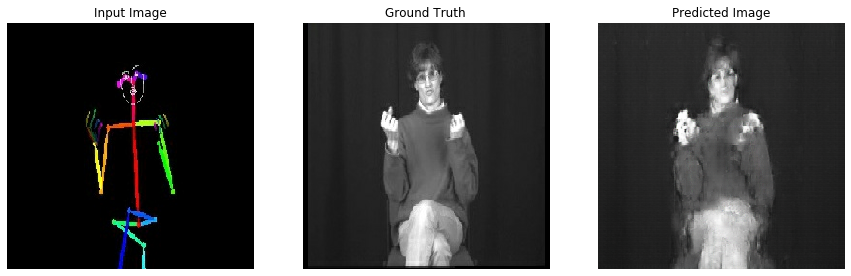

Epoch:  99
....................................................................................................
....................................................................................................
....................................................................................................
.............................................
Time taken for epoch 100 is 24.821765661239624 sec



In [22]:
BUFFER_SIZE = 400
BATCH_SIZE = 1
IMG_WIDTH = 256
IMG_HEIGHT = 256

from PIL import Image
import cv2
import numpy as np
PATH = '/content/new'
def load(image_file):
  
  image = tf.io.read_file(image_file) 
  image = tf.image.decode_jpeg(image)

  w = tf.shape(image)[1]

  w = w // 2
  print(w)
  real_image = image[:, :w, :]
  input_image = image[:, w:, :]

  input_image = tf.cast(input_image, tf.float32)
  real_image = tf.cast(real_image, tf.float32)

  return input_image, real_image
inp, re = load(PATH+'/train/image370.jpg')
print(inp.shape)
# casting to int for matplotlib to show the image
plt.figure()
plt.imshow(inp/255.0)
plt.figure()
plt.imshow(re/255.0)

def resize(input_image, real_image, height, width):
  input_image = tf.image.resize(input_image, [height, width],
                                method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
  real_image = tf.image.resize(real_image, [height, width],
                               method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)

  return input_image, real_image
def random_crop(input_image, real_image):
  stacked_image = tf.stack([input_image, real_image], axis=0)
  cropped_image = tf.image.random_crop(
      stacked_image, size=[2, IMG_HEIGHT, IMG_WIDTH, 3])

  return cropped_image[0], cropped_image[1]

# normalizing the images to [-1, 1]

def normalize(input_image, real_image):
  input_image = (input_image / 127.5) - 1
  real_image = (real_image / 127.5) - 1

  return input_image, real_image
@tf.function()
def random_jitter(input_image, real_image):
  # resizing to 286 x 286 x 3
  input_image, real_image = resize(input_image, real_image, 286, 286)

  # randomly cropping to 256 x 256 x 3
  input_image, real_image = random_crop(input_image, real_image)

  if tf.random.uniform(()) > 0.5:
    # random mirroring
    input_image = tf.image.flip_left_right(input_image)
    real_image = tf.image.flip_left_right(real_image)

  return input_image, real_image


plt.figure(figsize=(6, 6))
for i in range(4):
  rj_inp, rj_re = random_jitter(inp, re)
  plt.subplot(2, 2, i+1)
  print(rj_inp.shape)
  plt.imshow(rj_inp/255.0)
  #plt.axis('off')
plt.show()
def load_image_train(image_file):
  input_image, real_image = load(image_file)
  input_image, real_image = random_jitter(input_image, real_image)
  input_image, real_image = normalize(input_image, real_image)

  return input_image, real_image
def load_image_test(image_file):
  input_image, real_image = load(image_file)
  input_image, real_image = resize(input_image, real_image,
                                   IMG_HEIGHT, IMG_WIDTH)
  input_image, real_image = normalize(input_image, real_image)

  return input_image, real_image
train_dataset = tf.data.Dataset.list_files(PATH+'/train/*.jpg')
train_dataset = train_dataset.map(load_image_train,
                                  num_parallel_calls=tf.data.experimental.AUTOTUNE)
train_dataset = train_dataset.shuffle(BUFFER_SIZE)
train_dataset = train_dataset.batch(BATCH_SIZE)
test_dataset = tf.data.Dataset.list_files(PATH+'/val/*.jpg')
test_dataset = test_dataset.map(load_image_test)
test_dataset = test_dataset.batch(BATCH_SIZE)
OUTPUT_CHANNELS = 3
def downsample(filters, size, apply_batchnorm=True):
  initializer = tf.random_normal_initializer(0., 0.02)

  result = tf.keras.Sequential()
  result.add(
      tf.keras.layers.Conv2D(filters, size, strides=2, padding='same',
                             kernel_initializer=initializer, use_bias=False))

  if apply_batchnorm:
    result.add(tf.keras.layers.BatchNormalization())

  result.add(tf.keras.layers.LeakyReLU())

  return result
down_model = downsample(3, 4)
down_result = down_model(tf.expand_dims(inp, 0))
print (down_result.shape)

def upsample(filters, size, apply_dropout=False):
  initializer = tf.random_normal_initializer(0., 0.02)

  result = tf.keras.Sequential()
  result.add(
    tf.keras.layers.Conv2DTranspose(filters, size, strides=2,
                                    padding='same',
                                    kernel_initializer=initializer,
                                    use_bias=False))

  result.add(tf.keras.layers.BatchNormalization())

  if apply_dropout:
      result.add(tf.keras.layers.Dropout(0.5))

  result.add(tf.keras.layers.ReLU())

  return result
up_model = upsample(3, 4)
up_result = up_model(down_result)
print (up_result.shape)
def Generator():
  inputs = tf.keras.layers.Input(shape=[256,256,3])

  down_stack = [
    downsample(64, 4, apply_batchnorm=False), # (bs, 128, 128, 64)
    downsample(128, 4), # (bs, 64, 64, 128)
    downsample(256, 4), # (bs, 32, 32, 256)
    downsample(512, 4), # (bs, 16, 16, 512)
    downsample(512, 4), # (bs, 8, 8, 512)
    downsample(512, 4), # (bs, 4, 4, 512)
    downsample(512, 4), # (bs, 2, 2, 512)
    downsample(512, 4), # (bs, 1, 1, 512)
  ]

  up_stack = [
    upsample(512, 4, apply_dropout=True), # (bs, 2, 2, 1024)
    upsample(512, 4, apply_dropout=True), # (bs, 4, 4, 1024)
    upsample(512, 4, apply_dropout=True), # (bs, 8, 8, 1024)
    upsample(512, 4), # (bs, 16, 16, 1024)
    upsample(256, 4), # (bs, 32, 32, 512)
    upsample(128, 4), # (bs, 64, 64, 256)
    upsample(64, 4), # (bs, 128, 128, 128)
  ]

  initializer = tf.random_normal_initializer(0., 0.02)
  last = tf.keras.layers.Conv2DTranspose(OUTPUT_CHANNELS, 4,
                                         strides=2,
                                         padding='same',
                                         kernel_initializer=initializer,
                                         activation='tanh') # (bs, 256, 256, 3)

  x = inputs

  # Downsampling through the model
  skips = []
  for down in down_stack:
    x = down(x)
    skips.append(x)

  skips = reversed(skips[:-1])

  # Upsampling and establishing the skip connections
  for up, skip in zip(up_stack, skips):
    x = up(x)
    x = tf.keras.layers.Concatenate()([x, skip])

  x = last(x)

  return tf.keras.Model(inputs=inputs, outputs=x)
generator = Generator()
tf.keras.utils.plot_model(generator, show_shapes=True, dpi=64)
gen_output = generator(inp[tf.newaxis,...], training=False)
plt.imshow(gen_output[0,...])
LAMBDA = 100
def generator_loss(disc_generated_output, gen_output, target):
  gan_loss = loss_object(tf.ones_like(disc_generated_output), disc_generated_output)

  # mean absolute error
  l1_loss = tf.reduce_mean(tf.abs(target - gen_output))

  total_gen_loss = gan_loss + (LAMBDA * l1_loss)

  return total_gen_loss, gan_loss, l1_loss
def Discriminator():
  initializer = tf.random_normal_initializer(0., 0.02)

  inp = tf.keras.layers.Input(shape=[256, 256, 3], name='input_image')
  tar = tf.keras.layers.Input(shape=[256, 256, 3], name='target_image')

  x = tf.keras.layers.concatenate([inp, tar]) # (bs, 256, 256, channels*2)

  down1 = downsample(64, 4, False)(x) # (bs, 128, 128, 64)
  down2 = downsample(128, 4)(down1) # (bs, 64, 64, 128)
  down3 = downsample(256, 4)(down2) # (bs, 32, 32, 256)

  zero_pad1 = tf.keras.layers.ZeroPadding2D()(down3) # (bs, 34, 34, 256)
  conv = tf.keras.layers.Conv2D(512, 4, strides=1,
                                kernel_initializer=initializer,
                                use_bias=False)(zero_pad1) # (bs, 31, 31, 512)

  batchnorm1 = tf.keras.layers.BatchNormalization()(conv)

  leaky_relu = tf.keras.layers.LeakyReLU()(batchnorm1)

  zero_pad2 = tf.keras.layers.ZeroPadding2D()(leaky_relu) # (bs, 33, 33, 512)

  last = tf.keras.layers.Conv2D(1, 4, strides=1,
                                kernel_initializer=initializer)(zero_pad2) # (bs, 30, 30, 1)

  return tf.keras.Model(inputs=[inp, tar], outputs=last)
discriminator = Discriminator()
tf.keras.utils.plot_model(discriminator, show_shapes=True, dpi=64)
disc_out = discriminator([inp[tf.newaxis,...], gen_output], training=False)
plt.imshow(disc_out[0,...,-1], vmin=-20, vmax=20, cmap='RdBu_r')
plt.colorbar()
loss_object = tf.keras.losses.BinaryCrossentropy(from_logits=True)
def discriminator_loss(disc_real_output, disc_generated_output):
  real_loss = loss_object(tf.ones_like(disc_real_output), disc_real_output)

  generated_loss = loss_object(tf.zeros_like(disc_generated_output), disc_generated_output)

  total_disc_loss = real_loss + generated_loss

  return total_disc_loss
generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
checkpoint_dir = './training_checkpoints'
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=generator,
                                 discriminator=discriminator)
def generate_images(model, test_input, tar):
  prediction = model(test_input, training=True)
  plt.figure(figsize=(15,15))

  display_list = [test_input[0], tar[0], prediction[0]]
  title = ['Input Image', 'Ground Truth', 'Predicted Image']

  for i in range(3):
    plt.subplot(1, 3, i+1)
    plt.title(title[i])
    # getting the pixel values between [0, 1] to plot it.
    plt.imshow(display_list[i] * 0.5 + 0.5)
    plt.axis('off')
  plt.show()
for example_input, example_target in test_dataset.take(1):
  generate_images(generator, example_input, example_target)
EPOCHS = 150
import datetime
log_dir="logs/"

summary_writer = tf.summary.create_file_writer(
  log_dir + "fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
@tf.function
def train_step(input_image, target, epoch):
  with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
    gen_output = generator(input_image, training=True)

    disc_real_output = discriminator([input_image, target], training=True)
    disc_generated_output = discriminator([input_image, gen_output], training=True)

    gen_total_loss, gen_gan_loss, gen_l1_loss = generator_loss(disc_generated_output, gen_output, target)
    disc_loss = discriminator_loss(disc_real_output, disc_generated_output)

  generator_gradients = gen_tape.gradient(gen_total_loss,
                                          generator.trainable_variables)
  discriminator_gradients = disc_tape.gradient(disc_loss,
                                               discriminator.trainable_variables)

  generator_optimizer.apply_gradients(zip(generator_gradients,
                                          generator.trainable_variables))
  discriminator_optimizer.apply_gradients(zip(discriminator_gradients,
                                              discriminator.trainable_variables))

  with summary_writer.as_default():
    tf.summary.scalar('gen_total_loss', gen_total_loss, step=epoch)
    tf.summary.scalar('gen_gan_loss', gen_gan_loss, step=epoch)
    tf.summary.scalar('gen_l1_loss', gen_l1_loss, step=epoch)
    tf.summary.scalar('disc_loss', disc_loss, step=epoch)
def fit(train_ds, epochs, test_ds):
  for epoch in range(epochs):
    start = time.time()

    display.clear_output(wait=True)

    for example_input, example_target in test_ds.take(1):
      generate_images(generator, example_input, example_target)
    print("Epoch: ", epoch)

    # Train
    for n, (input_image, target) in train_ds.enumerate():
      print('.', end='')
      if (n+1) % 100 == 0:
        print()
      train_step(input_image, target, epoch)
    print()

    # saving (checkpoint) the model every 20 epochs
    if (epoch + 1) % 20 == 0:
      checkpoint.save(file_prefix = checkpoint_prefix)

    print ('Time taken for epoch {} is {} sec\n'.format(epoch + 1,
                                                        time.time()-start))
  checkpoint.save(file_prefix = checkpoint_prefix)

EPOCHS = 100
fit(train_dataset, EPOCHS, test_dataset)

In [23]:
!ls {checkpoint_dir}
# restoring the latest checkpoint in checkpoint_dir
checkpoint.restore(tf.train.latest_checkpoint(checkpoint_dir))

checkpoint		    ckpt-4.data-00000-of-00002
ckpt-1.data-00000-of-00002  ckpt-4.data-00001-of-00002
ckpt-1.data-00001-of-00002  ckpt-4.index
ckpt-1.index		    ckpt-5.data-00000-of-00002
ckpt-2.data-00000-of-00002  ckpt-5.data-00001-of-00002
ckpt-2.data-00001-of-00002  ckpt-5.index
ckpt-2.index		    ckpt-6.data-00000-of-00002
ckpt-3.data-00000-of-00002  ckpt-6.data-00001-of-00002
ckpt-3.data-00001-of-00002  ckpt-6.index
ckpt-3.index


In [24]:
test_path = './out'
test_dataset = tf.data.Dataset.list_files(test_path+'/test/*.jpg')
test_dataset = test_dataset.map(load_image_test)
test_dataset = test_dataset.batch(BATCH_SIZE)

Tensor("floordiv:0", shape=(), dtype=int32)


In [0]:
os.mkdir('frames_generated')

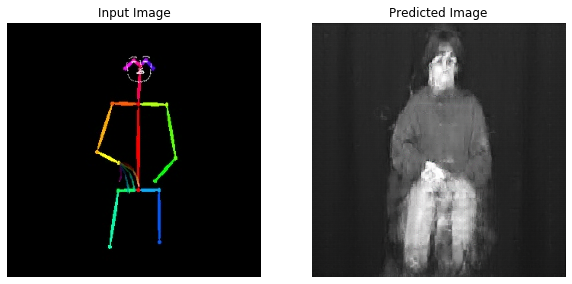

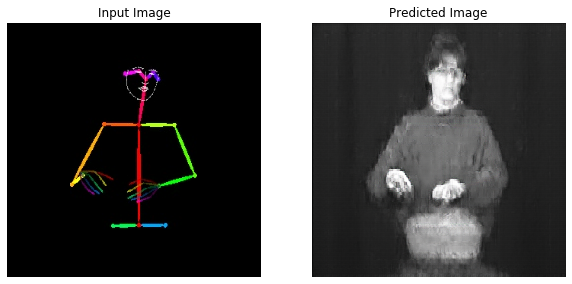

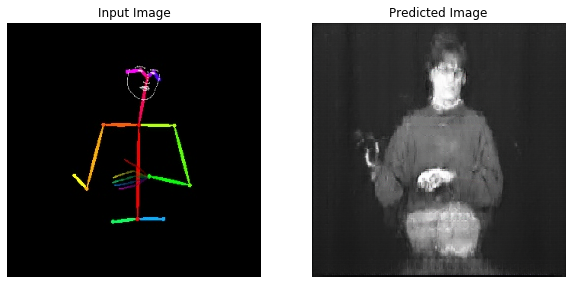

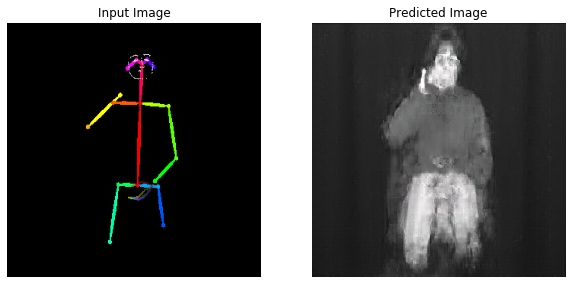

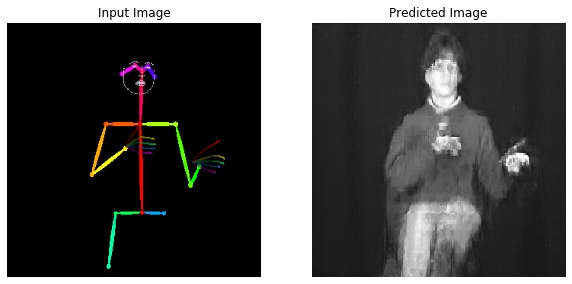

...

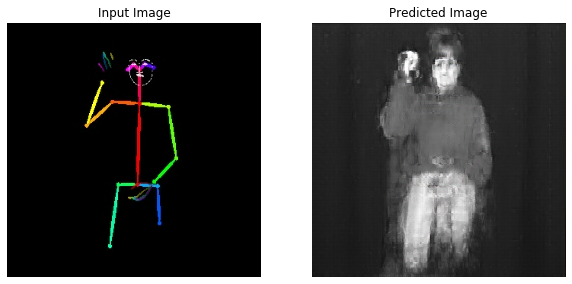

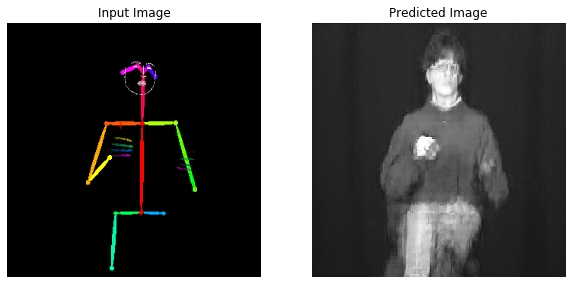

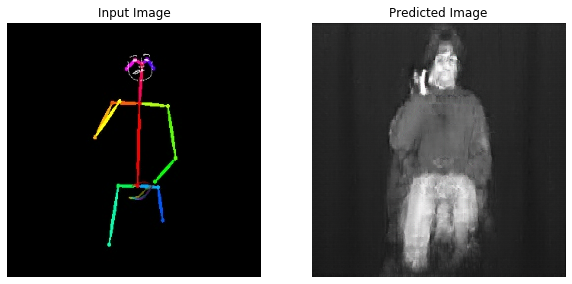

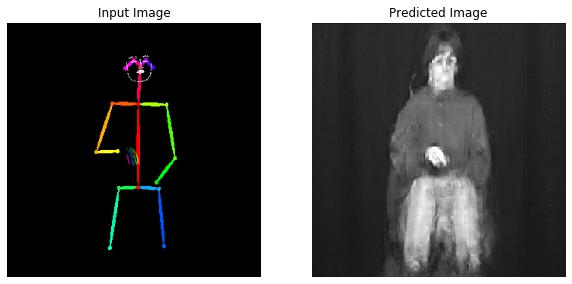

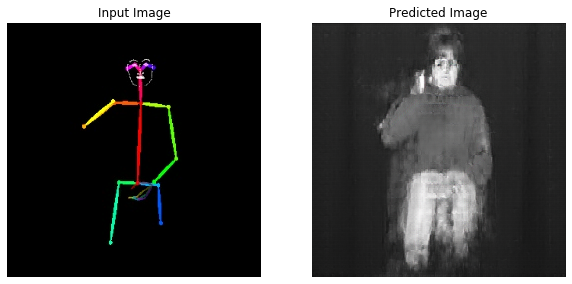

In [30]:
# Run the trained model on a few examples from the test dataset
def generate_images(model, test_input, tar,f):
  prediction = model(test_input, training=True)
  display_list = [test_input[0], prediction[0]]
  title = ['Input Image', 'Predicted Image']
  plt.figure(figsize=(10,10))
  for i in range(2):
    plt.subplot(1, 2, i+1)
    plt.title(title[i])
    # getting the pixel values between [0, 1] to plot it.
    plt.imshow(display_list[i] * 0.5 + 0.5)
    plt.axis('off')
  plt.savefig('./frames_generated/'+str(f)+'.png')
  plt.show()
  #f = f+1
  #cv2.imwrite('./frames_generated/'+str(f)+'.png',prediction[0])
f =0
for inp, tar in test_dataset.take(len(os.listdir(test_path+'/test/'))):
  f = f+1
  generate_images(generator, inp, tar,f)

In [0]:
!zip -r frames.zip /content/frames_generated

#vedio generation

In [0]:
import cv2
import numpy as np
import os
from os.path import isfile, join
pathIn= '/content/frames_generated/'
pathOut = 'video.avi'
fps = 6
frame_array = []
files = [f for f in os.listdir(pathIn) if isfile(join(pathIn, f))]
#for sorting the file names properly
files.sort(key = lambda x: x[5:-4])
files.sort()
frame_array = []
files = [f for f in os.listdir(pathIn) if isfile(join(pathIn, f))]
#for sorting the file names properly
files.sort(key = lambda x: x[5:-4])
for i in range(len(files)):
    filename=pathIn + files[i]
    #reading each files
    img = cv2.imread(filename)
    height, width, layers = img.shape
    size = (width,height)
    
    #inserting the frames into an image array
    frame_array.append(img)
out = cv2.VideoWriter(pathOut,cv2.VideoWriter_fourcc(*'DIVX'), fps, size)
for i in range(len(frame_array)):
    # writing to a image array
    out.write(frame_array[i])
out.release()